In [1]:
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Conv2D, Conv2DTranspose, BatchNormalization,Activation, MaxPool2D, Concatenate
from tensorflow.keras.optimizers import Adam
from PIL import Image 
import numpy as np
import re
import os 
import glob 
import random
import logging
from tensorflow.keras import backend as K
import math
tf.get_logger().setLevel(logging.ERROR)

In [2]:
def conv_block(input, num_filters):
    x = Conv2D(num_filters, 3, padding="same", use_bias=False)(input)
    x = BatchNormalization()(x)
    x = Activation("relu")(x)

    x = Conv2D(num_filters, 3, padding="same", use_bias=False)(x)
    x = BatchNormalization()(x)
    x = Activation("relu")(x)

    return x

def encoder_block(input, num_filters):
    x = conv_block(input, num_filters)
    p = MaxPool2D((2, 2))(x)
    return x, p


def decoder_block(input, skip_features, num_filters):
    x = Conv2DTranspose(num_filters, (2, 2), strides=2, padding="same")(input)
    x = Concatenate()([x, skip_features])
    x = conv_block(x, num_filters)
    return x


def build_unet(input_shape, n_classes):
    inputs = tf.keras.layers.Input(shape=input_shape)
    c1, p1 = encoder_block(inputs, 16)
    c2, p2 = encoder_block(p1, 32)
    c3, p3 = encoder_block(p2, 64)
    c4, p4 = encoder_block(p3, 128)

    c5 = conv_block(p4, 256) #Bridge
    c6 = decoder_block(c5, c4, 128)
    c7 = decoder_block(c6, c3, 64)
    c8 = decoder_block(c7, c2, 32)
    c9 = decoder_block(c8, c1, 16)

    if n_classes == 1:  #Binary
        activation = 'sigmoid'
    else:
        activation = 'softmax'
    
    outputs = Conv2D(n_classes, 1, padding="same", activation=activation)(c9)
    model = Model(inputs, outputs, name="U-Net")
    return model

In [3]:
import matplotlib.pyplot as plt

def visualize(original, augmented, figure_size=(10,5)):
    fig = plt.figure(figsize=figure_size)
    plt.subplot(1,2,1)
    plt.title('Original image')
    plt.imshow(original)
    plt.axis("off")

    plt.subplot(1,2,2)
    plt.title('Augmented image')
    plt.imshow(augmented)
    plt.axis("off")

In [5]:
checkpoint_path = "/app/seg/event_detection_seg_1000.h5"
model = build_unet(input_shape=(128,128,3), n_classes=1)
model.load_weights(checkpoint_path)

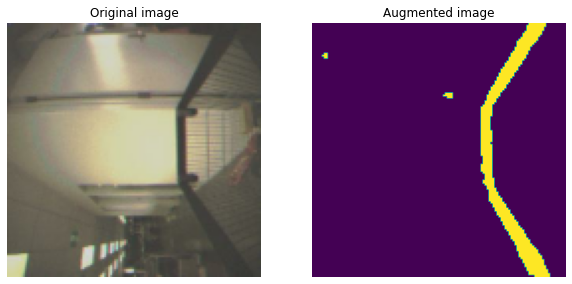

In [285]:
# img_path = "/app/seg/event_detection/jpgs/ED_170823_IN_4_1692240977700_7758666_0_00_0323.jpg" # good 
# img_path = "/app/seg/event_detection/jpgs/ED_170823_IN_4_1692241076950_7847249_2_00_4413.jpg" # good 
# img_path = "/app/seg/event_detection/jpgs/ED_170823_OUT_3_1692240663081_7443685_1_00_0050.jpg" # good 
# img_path = "/app/seg/event_detection/jpgs/nothing_310723_102_00_6730.jpg"
# img_path = "/app/seg/event_detection/jpgs/nothing_310723_101_00_3801.jpg" # good 
# img_path = "/app/seg/event_detection/jpgs/nothing_310723_100_00_3670.jpg"
# img_path = "/app/seg/event_detection/jpgs/imagr-261023_imagr-new-trolley__1_1698273200073_9978478.jpg"
# img_path = "/app/seg/event_detection/jpgs/imagr-261023_imagr-new-trolley__2_1698273306224_10091150.jpg"
# img_path = "/app/seg/event_detection/jpgs/imagr-121023_nigel_false-positive1_0_1697068847138_12000252.jpg"
# img_path = "/app/seg/event_detection/jpgs/imagr-111023_nigel_false-positive-4_1_1696993794369_9022302.jpg"
# img_path = "/app/seg/event_detection/jpgs/imagr-111023_nigel_false-positive-3_2_1696990067532_5293620.jpg"
# img_path = "/app/seg/event_detection/jpgs/imagr-111023_nigel_false-positive-12_1_1696978785210_140552.jpg"
# img_path = "/app/seg/event_detection/jpgs/1694669267376_15233650_0_4a37f8c7-02a4-90ab-0cc2-f5fb9865ef89.jpg"
# img_path = "/app/seg/event_detection/jpgs/1694392482147_5772997_0_22df01c7-cafa-7ab6-3f64-206894bb97d2.jpg"
# img_path = "/app/seg/event_detection/jpgs/1693949112834_739003_0_8c19d391-2df9-2c73-eadc-ceb340a182cb.jpg"
# img_path = "/app/seg/event_detection/jpgs/1693948994824_621191_1_a5bed722-1bb8-8837-4fef-7e0de9fcc83e.jpg" # weird
# img_path = "/app/seg/event_detection/jpgs/1693948933559_558927_2_17bf6f4c-19b0-0015-9f6d-2a078c01989d.jpg" # slightly good 
# img_path = "/app/seg/event_detection/jpgs/1693948907227_533383_0_89822994-25e4-97bf-e861-813862aa1333.jpg"
# img_path = "/app/seg/event_detection/jpgs/ED_170823_OUT_4_1692241124845_7905317_1_00_0222.jpg" # good 
# img_path = "/app/seg/event_detection/jpgs/imagr_imagr_270324-data-v8_0_1711498147175_596161.jpg"
# img_path = "/app/seg/event_detection/jpgs/imagr_imagr_270324-data-v8_2_1711498146432_583807.jpg" # slightly good 
# img_path = "/app/seg/event_detection/jpgs/imagr-061123_imagr-new-cam-angles_nothing_1_1699217087803_388132.jpg"
# img_path = "/app/seg/event_detection/jpgs/1693431880629_1991661_1_e77e43d3-5748-3dc1-cee4-9c02588856a8.jpg"
img_path = "/app/seg/event_detection/test/imagr_imagr_020424-1530-data-v8_0_1712024344783_1065471.jpg"
# img_path = "/app/seg/event_detection/test/imagr_imagr_020424-1530-data-v8_1_1712024218989_943068.jpg"
# img_path = "/app/seg/event_detection/test/imagr_imagr_020424-1530-data-v8_2_1712024344690_1071066.jpg"




img = tf.io.read_file(img_path)
img = tf.image.decode_image(img, channels=3, dtype=tf.float32)
img = tf.image.resize(img, [128,128])
input_img = tf.expand_dims(img, axis=0)
input_img.shape
output = model(input_img)
mask = np.squeeze(output)
mask = tf.where(mask > 0.1, 1., 0.0)
visualize(img, mask)

In [286]:
mask_np = np.array(mask, dtype=np.uint8)
print(mask_np.shape)
mask_pil = Image.fromarray(mask_np)
mask_pil.save("cam0_mask.png")

(128, 128)


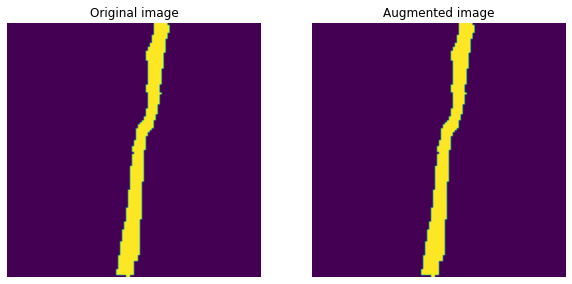

In [282]:
mask_r = Image.open("/app/seg/cam2_mask.png")
mask_np = np.array(mask_r)
visualize(mask_np, mask_np)

In [260]:
def apply_single_channel_mask(image, mask):
    mask_3_channels = np.repeat(mask[:, :, np.newaxis], 3, axis=2)
    masked_image = np.where(mask_3_channels, image, 0)
    return masked_image

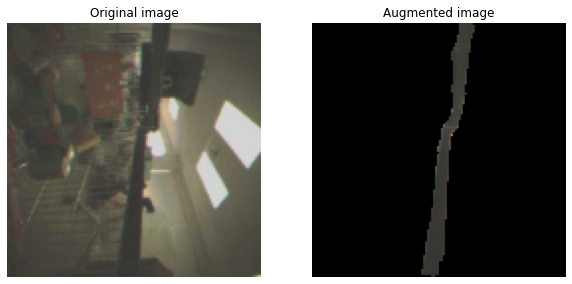

In [261]:
masked_img = apply_single_channel_mask(img, mask)
visualize(img, masked_img)

In [229]:
output = model(input_img)
mask = np.squeeze(output)
mask = tf.where(mask > 0.5, 1., 0.0)
mask.shape

TensorShape([128, 128])

In [230]:
print(np.average(mask))

0.043273926


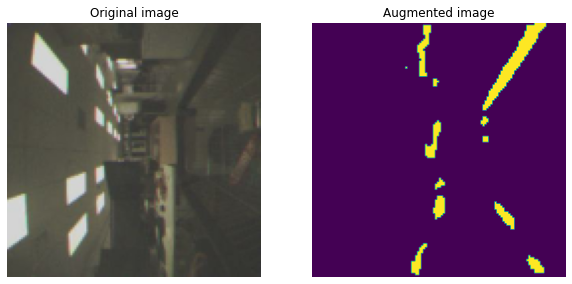

In [231]:
visualize(img, mask)

In [6]:
class DataReader(object):
    def __init__(self, img_dir, mask_dir, is_training=True, img_size=(128, 128)):
        self.img_dir = img_dir
        self.mask_dir = mask_dir
        self.imgs_path = glob.glob(f"{self.img_dir}/*.jpg")
        self.num_imgs = len(self.imgs_path)
        self.img_h, self.img_w = img_size
        self.is_training = is_training
        
    
    def __len__(self):
        return self.num_imgs
    
    
    def find_mask(self, img_path):
        mask_path = re.sub(self.img_dir, self.mask_dir, img_path)
        mask_path = re.sub(".jpg", ".png", mask_path)
        return mask_path if os.path.exists(mask_path) else None
    
    
    def load_normalized_resize_img(self, img_path, is_mask=False, resize_method=tf.image.ResizeMethod.BILINEAR):
        img = tf.io.read_file(img_path)
        channels = 1 if is_mask else 3
        # tf.image.decode_image if passing dtype=tf.float32, the value is range from [0,1] no need to normalized again 
        img = tf.image.decode_image(img, channels=channels, dtype=tf.float32)
        img = tf.image.resize_with_pad(img, self.img_h, self.img_w, method=resize_method)
        return img
        
    
    def __getitem__(self, index):
        img_path = self.imgs_path[index]
        mask_path = self.find_mask(img_path)
        
        img = self.load_normalized_resize_img(img_path)
        if mask_path:
            mask = self.load_normalized_resize_img(mask_path, is_mask=True)
        else:
            mask = tf.zeros((self.img_h, self.img_w, 1), dtype=tf.float32)
        mask = tf.where(mask > 0, 1., 0)
        
        if self.is_training:
            img, mask = self.geo_transform(img, mask)
            img = self.color_transform(img)
            img = tf.clip_by_value(img, 0, 1)
        
        return img, mask 
    
    
    def iter(self):
        for i in range(self.num_imgs):
            yield self[i]
            
    
    def geo_transform(self, img, mask):
        random_number = random.random()
        if random_number < 0.2:
            img = tf.image.flip_left_right(img)
            mask = tf.image.flip_left_right(mask)
        elif random_number < 0.4:
            img = tf.image.flip_up_down(img)
            mask = tf.image.flip_up_down(mask)
        elif random_number < 0.6:
            img = tf.image.rot90(img, 1)
            mask = tf.image.rot90(mask, 1)
        elif random_number < 0.8:
            img = tf.image.rot90(img, 3)
            mask = tf.image.rot90(mask, 3)
        return img, mask 
    
    
    def color_transform(self, img):
        random_number = random.random()
        if random_number < 0.2:
            img = tf.image.adjust_gamma(img, 0.6)
        elif random_number < 0.6:
            img = tf.image.random_brightness(img, max_delta=0.1)
        return img

In [7]:
img_dir = "/app/seg/event_detection/jpgs"
label_dir = "/app/seg/event_detection/masks"
data_reader = DataReader(img_dir, label_dir, is_training=False, img_size=(128, 128))
dataset = tf.data.Dataset.from_generator(data_reader.iter,
                                         output_types=(tf.float32, tf.float32),
                                         output_shapes=([128, 128, 3], [128, 128, 1]))

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  after removing the cwd from sys.path.


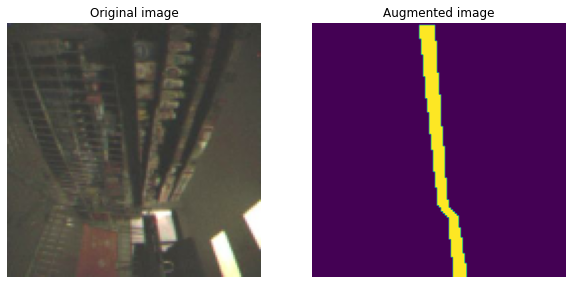

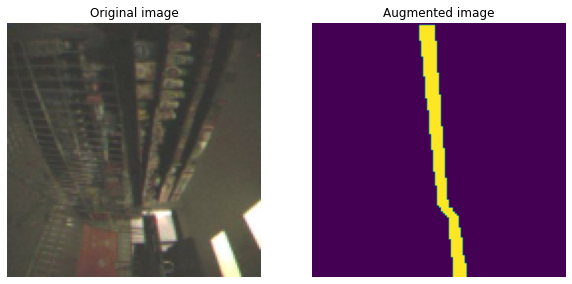

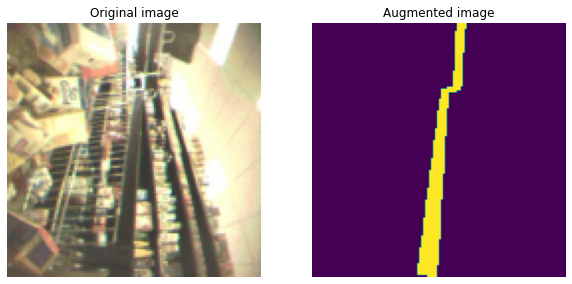

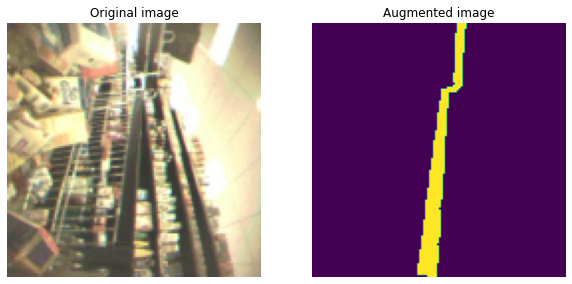

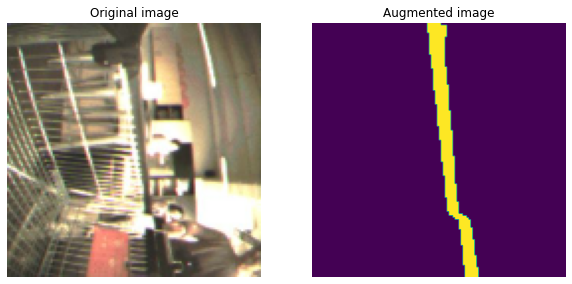

...

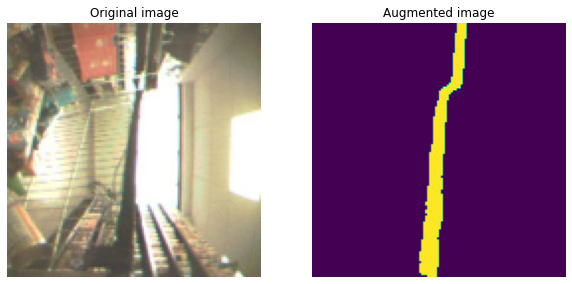

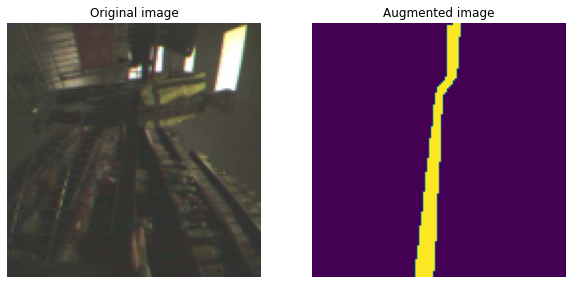

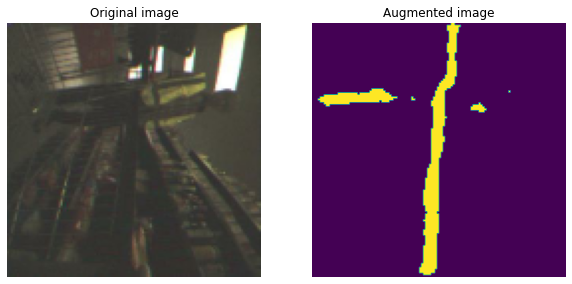

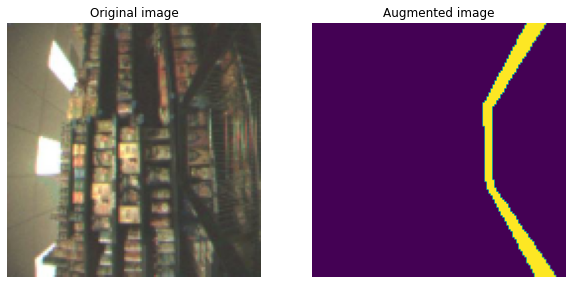

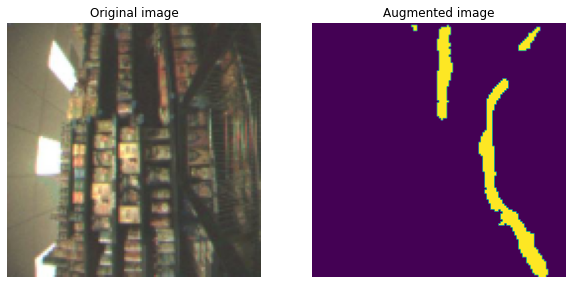

In [8]:
for img, mask in dataset:
    visualize(img, mask)
    output = model(tf.expand_dims(img,0))
    output = np.squeeze(output)
    output = tf.where(output > 0.02, 1., 0.0)
    visualize(img, output)